# Notebook 02: Cálculo de índices
### Procesamiento y calculo de índices 

Este notebook ayuda a calcular los índices espectrales relevantes para detectar cambios urbanos y de vegetación en Viña del Mar.

#### Índices espectrales requeridos 
A continuación se detallan los índices espectrales a calcular (solicitados en el enunciado):
- **NDVI:** Detecta vegetación *(Fórmula: (NIR-Red)/(NIR+Red))*
- **NDBI:** Detecta áreas construidas *(Fórmula: (SWIR-NIR)/(SWIR+NIR))*
- **NDWI:** Detecta cuerpos de agua *(Fórmula: (Green-NIR)/(Green+NIR))*
- **BSI:** Detecta suelo desnudo *(Fórmula: ((SWIR+Red)-(NIR+Blue)) / (SWIR+Red)+(NIR+Blue))*


#### Metodología de procesamiento

Para cuantificar la evolución temporal de las coberturas, se extraen estadísticas descriptivas (como media, desviación estándar, mínimo y máximo) de cada índice espectral. Siguiendo la siguiente metodología:
1.  **Máscara espacial:** Se utiliza el polígono vectorial de `limite_comuna.gpkg` para recortar (*masking*) las imágenes. Esto garantiza que el análisis excluya el mar y las comunas vecinas (Valparaíso, Quilpué, Concón), enfocándose estrictamente en el territorio administrativo de Viña del Mar.
2.  **Filtrado de datos:** Se aplica un filtro riguroso para excluir valores nulos (`NaN`) y bordes de imagen (`0`), asegurando que las estadísticas representen únicamente píxeles de tierra válidos.
3.  **Agregación temporal:** Se consolidan los resultados en un DataFrame y se visualizan mediante un gráfico de líneas para identificar tendencias, estacionalidad o eventos anómalos (como sequías o incendios).

##### 1) Configuración del entorno de trabajo

A continuación, se importan las librerías necesarias para el análisis de índices espectrales y se configura los directorios de entrada y salida del proyecto.

In [1]:
import os       # Manejo de variables de entorno y sistema operativo
import sys      # Manipulación de la ruta de módulos del sistema

# --- Importación de librerías para procesamiento raster ---
import rasterio                 # Lectura y escritura de archivos raster (GeoTIFF)
import numpy as np              # Operaciones numéricas con arrays multidimensionales

# --- Importación de librerías para análisis de datos ---
import pandas as pd             # Manipulación de datos tabulares (DataFrames)
import geopandas as gpd         # Procesamiento de datos vectoriales geoespaciales

# --- Importación de librerías de visualización ---
import matplotlib.pyplot as plt # Creación de gráficos y mapas estáticos
import seaborn as sns           # Visualizaciones estadísticas avanzadas

# --- Importación de utilidades ---
from pathlib import Path        # Manejo moderno de rutas de archivos
from rasterio.mask import mask  # Recorte de rasters usando geometrías vectoriales
from rasterio.plot import show  # Visualización rápida de rasters

# --- Configuración del directorio raíz del proyecto ---
# Se sube un nivel desde notebooks/ para acceder a la raíz del proyecto
project_root = Path("..").resolve()
# Se agrega al path de Python para poder importar módulos propios
sys.path.append(str(project_root))

# --- Definición de rutas de trabajo ---
processed_dir = project_root / "data" / "processed"  # Archivos de índices calculados
vector_dir = project_root / "data" / "vector"        # Datos vectoriales (límites, etc.)

# --- Configuración de directorios de salida ---
output_dirs = {
    "figures": project_root / "outputs" / "figures",  # Gráficos y mapas generados
    "maps":    project_root / "outputs" / "maps",     # Mapas temáticos
    "reports": project_root / "outputs" / "reports"   # Tablas CSV y reportes
}

# --- Crear carpetas de salida si no existen ---
for path in output_dirs.values():
    path.mkdir(parents=True, exist_ok=True)  # parents=True crea carpetas intermedias

print(f"✔ Directorio de datos procesados: {processed_dir}")

✔ Directorio de datos procesados: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\data\processed


##### 2) Verificación y ejecución automática de procesamiento

A continuación, se verifica si existen archivos de índices ya calculados. Si no existen, ejecuta automáticamente el script `calculate_indices.py` para generarlos. Esto asegura que los datos estén disponibles antes de continuar el análisis.

In [3]:
# Importar módulo para ejecutar comandos del sistema
import subprocess

# --- Verificar existencia de archivos de índices procesados ---
# Buscar archivos que coincidan con el patrón indices_*.tif
archivos_indices = list(processed_dir.glob("indices_*.tif"))

# Evaluar si es necesario ejecutar el procesamiento
if len(archivos_indices) == 0:
    # No hay archivos: ejecutar script de cálculo de índices
    print("AVISO: No se encontraron índices calculados. Ejecutando script de procesamiento...")
    print("➤ Esto puede tardar unos segundos...")
    
    # Definir ruta al script de cálculo de índices
    script_path = project_root / "scripts" / "calculate_indices.py"
    
    # Ejecutar script como subproceso y capturar salida
    result = subprocess.run([sys.executable, str(script_path)], capture_output=True, text=True)
    
    # Verificar resultado de la ejecución
    if result.returncode == 0:
        # Éxito: mostrar salida del script
        print("✔ Procesamiento completado exitosamente.")
        print(result.stdout)
    else:
        # Error: mostrar mensaje de error
        print("✘ Error en el script de procesamiento:")
        print(result.stderr)
else:
    # Ya existen archivos: saltar el procesamiento
    print(f"✔ Se encontraron {len(archivos_indices)} archivos procesados. Saltando cálculo.")

AVISO: No se encontraron índices calculados. Ejecutando script de procesamiento...
➤ Esto puede tardar unos segundos...
✔ Procesamiento completado exitosamente.
➤ Iniciando cálculo de índices espectrales...
Origen: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\data\raw
Destino: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\data\processed


✔ ✔ Proceso completado. Metadatos en: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\data\processed\metadata.txt



##### 3) Lectura de metadatos y listado de archivos

Lee y muestra el archivo de metadatos generado por el script de procesamiento. Además, lista todos los archivos de índices disponibles para el análisis.

In [4]:
# --- 1. Lectura y visualización del archivo de metadatos ---
# Definir ruta al archivo de metadatos
metadata_file = processed_dir / "metadata.txt"

print("=== REPORTE DE PROCESAMIENTO (metadata.txt) ===")

# Verificar existencia y leer contenido
if metadata_file.exists():
    # Abrir y mostrar contenido completo del archivo
    with open(metadata_file, "r", encoding="utf-8") as f:
        print(f.read())
else:
    # Advertir si no se encuentra el archivo
    print("✘ No se encontró el archivo metadata.txt")

# --- 2. Listar imágenes de índices disponibles ---
# Buscar archivos de índices ordenados alfabéticamente (por año)
imagenes = sorted(list(processed_dir.glob("indices_*.tif")))

# Mostrar cantidad de archivos encontrados
print(f"\n✔ Se encontraron {len(imagenes)} imágenes de índices procesados.")

=== REPORTE DE PROCESAMIENTO (metadata.txt) ===
METADATOS DE ÍNDICES ESPECTRALES (PROCESSED)
Generado el: 2026-01-29 21:05:12

Archivo: indices_2019.tif
 - Año: 2019
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.305
   * NDBI: 0.036
   * NDWI: -0.319
   * BSI:  0.039
------------------------------
Archivo: indices_2020.tif
 - Año: 2020
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.250
   * NDBI: 0.097
   * NDWI: -0.303
   * BSI:  0.117
------------------------------
Archivo: indices_2021.tif
 - Año: 2021
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.295
   * NDBI: 0.034
   * NDWI: -0.313
   * BSI:  0.043
------------------------------
Archivo: indices_2022.tif
 - Año: 2022
 - Bandas: 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
 - Estadísticas (Promedio):
   * NDVI: 0.239
   * NDBI: 0.097
   * NDWI: -0.277
   * BSI:  0.098
------------------------------
Archivo: indices_2023.tif
 - Año: 2023
 -

##### **4) Cálculo de estadísticas anuales y tendencias**

A continuación, se calculan estadísticas descriptivas (media, std, min, max) para cada índice espectral por año, aplicando una máscara espacial al límite comunal. Y se genera un gráfico de tendencias temporales y exporta los datos a CSV.

##### Análisis de resultados (2019-2025)

El gráfico de evolución temporal y la tabla estadística revelan patrones clave en la dinámica territorial de Viña del Mar durante el periodo de estudio:

1. Comportamiento del NDVI (vegetación)
* **Tendencia general:** El NDVI (línea roja) es el índice predominante, oscilando entre **0.30 y 0.36** en promedio, lo que indica una cobertura mixta donde coexisten zonas urbanas y vegetación (cerros, parques).
* **Mínimos locales (2020 y 2022):** Se observan mínimos locales en el promedio de NDVI en los años 2020 (0.299) y 2022 (0.311). Esto es consistente con los periodos más agudos de la megasequía en la zona central de Chile, donde la vegetación natural (matorral esclerófilo) pierde vigor en verano (recordando que la extracción de estas imágenes pertenecían a los periodos de Enero a Marzo de cada año).
* **Impacto de incendios (2024):** A pesar del megaincendio de febrero de 2024, el promedio global de NDVI (0.339) no muestra un desplome catastrófico respecto a 2023 (0.350). Esto sugiere que, aunque el daño fue severo localmente, la superficie quemada representa una fracción menor respecto al total de la comuna (que incluye grandes áreas verdes no afectadas hacia el interior y la zona urbana consolidada). Esto justifica la necesidad de los mapas de cambio espacial, que se verán más adelante, para localizar el daño que el promedio esconde.

2. Correlación Inversa (NDVI vs NDBI/BSI)
* Se evidencia una clara **correlación negativa** entre la vegetación (NDVI) y los índices de suelo/construcción (NDBI y BSI). En los años donde la vegetación cae (2020, 2022), los índices de suelo desnudo y construcción suben, lo que no significa necesariamente que se construyeron edificios y se demolieron en un año, más bien, el NDBI y BSI tienden a confundir suelo desnudo seco con urbanización. Probablemente en años secos, la vegetación se seca, expone el suelo, y el sensor lo detecta como un aumento en la señal "urbana/suelo".

3. Estabilidad del NDWI (Agua)
* El índice de agua (línea verde) se mantiene estable y negativo (~ -0.42), lo cual es esperable ya que el análisis se realiza sobre la superficie terrestre continental, excluyendo el océano.

4. Variabilidad Espacial (Desviación Estándar)
* La desviación estándar alta del NDVI (~0.20) indica una alta heterogeneidad espacial. Por lo tanto, Viña del Mar no es homogénea, ya que posee zonas de muy alta vegetación (como la Quinta Vergara y el Jardín Botánico) y zonas de muy baja vegetación (como el centro urbano), lo que amplía la dispersión de los datos.

➤ Calculando estadísticas anuales (Media, Std, Min, Max) dentro de la comuna...
✔ Gráfico guardado en: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\figures\02_tendencias_indices.png


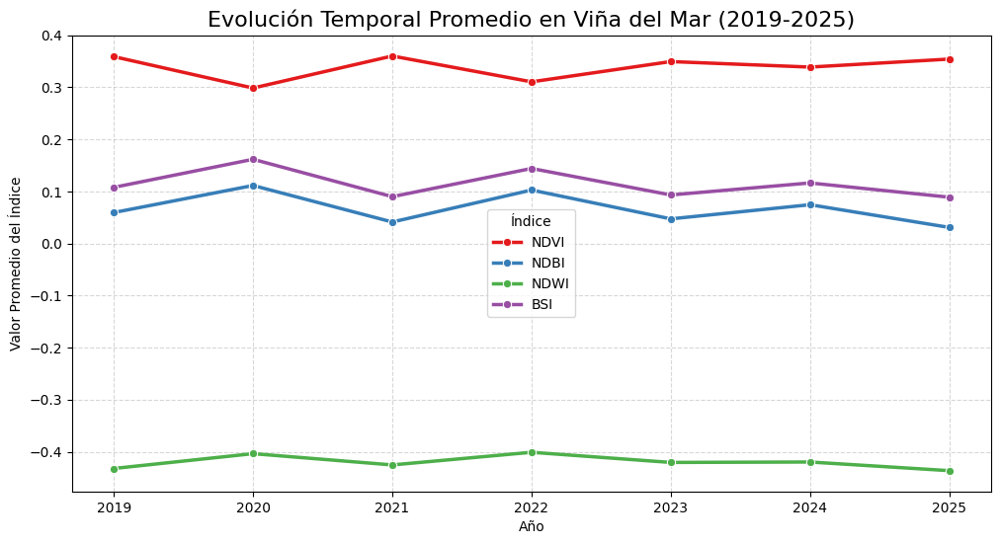

✔ Tabla de datos completa guardada en: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\reports\02_estadisticas_anuales.csv

--- Vista Previa (Media y Desviación Estándar) ---


Media                                     Std                      \
Índice       BSI      NDBI      NDVI      NDWI       BSI      NDBI      NDVI   
Año                                                                            
2019    0.107899  0.059546  0.358990 -0.432042  0.123971  0.137518  0.205888   
2020    0.161809  0.111488  0.298631 -0.403539  0.114029  0.132207  0.181120   
2021    0.089984  0.041347  0.360186 -0.425226  0.118933  0.130345  0.204716   
2022    0.144193  0.102758  0.310573 -0.400908  0.109789  0.128983  0.181315   
2023    0.093306  0.047394  0.349500 -0.420423  0.117159  0.130183  0.197529   
2024    0.116368  0.074566  0.338907 -0.419588  0.135112  0.156997  0.206961   
2025    0.089009  0.030984  0.354274 -0.436222  0.125673  0.135789  0.206651   

                  
Índice      NDWI  
Año               
2019    0.165190  
2020    0.156053  
2021    0.165916  
2022    0.149604  
2023    0.158835  
2024    0.168492  
2025    0.170001

In [5]:
# --- Cargar límite comunal para recorte espacial ---
# El límite asegura que solo se analicen píxeles dentro de Viña del Mar
gdf_limite_global = gpd.read_file(vector_dir / "limite_comuna.gpkg")

# --- Inicializar estructuras de datos ---
data_stats = []  # Lista para acumular estadísticas de cada año/índice

# Diccionario que mapea número de banda a nombre del índice
nombres_indices = {1: "NDVI", 2: "NDBI", 3: "NDWI", 4: "BSI"}

print("➤ Calculando estadísticas anuales (Media, Std, Min, Max) dentro de la comuna...")

# --- Iterar sobre cada imagen de índices ---
for img in imagenes:
    # Extraer año del nombre del archivo (ej: indices_2019.tif -> 2019)
    year = img.stem.split("_")[1]
    
    # Abrir archivo raster para lectura
    with rasterio.open(img) as src:
        # 1. Gestión de sistema de coordenadas (CRS)
        # Verificar si el vector y el raster tienen el mismo CRS
        if gdf_limite_global.crs != src.crs: 
            # Reproyectar vector al CRS del raster si difieren
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else:
            gdf_recorte = gdf_limite_global
            
        # 2. Aplicar máscara de recorte espacial
        # Elimina píxeles fuera del límite comunal
        out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
        
        # out_image tiene forma (bandas, alto, ancho) donde:
        # Banda 0=NDVI, Banda 1=NDBI, Banda 2=NDWI, Banda 3=BSI
        
        # 3. Calcular estadísticas para cada índice
        for i, nombre in nombres_indices.items():
            # i es 1,2,3,4 -> restamos 1 para índice 0-based del array
            banda_data = out_image[i-1] 
            
            # 4. Filtrado riguroso de píxeles válidos
            # - Debe ser finito (no NaN, no infinito)
            # - Debe ser distinto de 0 (el 0 es relleno de la máscara)
            valid_pixels = banda_data[(np.isfinite(banda_data)) & (banda_data != 0)]
            
            # Solo calcular si hay píxeles válidos
            if len(valid_pixels) > 0:
                # Agregar registro con estadísticas del índice para este año
                data_stats.append({
                    "Año": int(year),
                    "Índice": nombre,
                    "Media": np.nanmean(valid_pixels),   # Promedio del índice
                    "Std": np.nanstd(valid_pixels),      # Desviación estándar
                    "Min": np.nanmin(valid_pixels),      # Valor mínimo
                    "Max": np.nanmax(valid_pixels)       # Valor máximo
                })

# --- Crear DataFrame con todas las estadísticas ---
df_stats = pd.DataFrame(data_stats)

# --- Generar gráfico de tendencias temporales ---
plt.figure(figsize=(12, 6))

# Gráfico de líneas con puntos marcadores para cada índice
sns.lineplot(data=df_stats, x="Año", y="Media", hue="Índice", marker="o", linewidth=2.5, palette="Set1")

# Configuración estética del gráfico
plt.title("Evolución Temporal Promedio en Viña del Mar (2019-2025)", fontsize=16)
plt.ylabel("Valor Promedio del Índice")
plt.grid(True, linestyle='--', alpha=0.5)  # Grilla suave para lectura

# --- Guardar gráfico como imagen PNG ---
fig_path = output_dirs["figures"] / "02_tendencias_indices.png"
plt.savefig(fig_path, dpi=300, bbox_inches='tight')  # Alta resolución para informe
print(f"✔ Gráfico guardado en: {fig_path}")

plt.show()

# --- Exportar tabla de estadísticas a CSV ---
csv_path = output_dirs["reports"] / "02_estadisticas_anuales.csv"
df_stats.to_csv(csv_path, index=False)  # Sin índice numérico
print(f"✔ Tabla de datos completa guardada en: {csv_path}")

# --- Mostrar resumen visual en formato pivoteado ---
print("\n--- Vista Previa (Media y Desviación Estándar) ---")
# Tabla pivote: filas=Años, columnas=Índices, valores=Media y Std
display(df_stats.pivot(index="Año", columns="Índice", values=["Media", "Std"]))

##### **5) Clasificación de coberturas y cálculo de evolución de superficies**

A continuación, se cuantifica la superficie ocupada por cada tipo de cobertura terrestre en hectáreas. A diferencia de las estadísticas generales (promedios), aquí se aplica una lógica de clasificación basada en umbrales (Thresholding) para categorizar cada píxel.

En otras palabras, se clasifican los píxeles según umbrales de índices espectrales y se calcula el área en hectáreas para cada categoría de cobertura terrestre. Además, se generan gráficos de evolución temporal para vegetación, área urbana, agua y suelo desnudo en Viña del Mar (2019-2025).

**Metodología de Clasificación:**
Se definen las siguientes reglas de decisión para cada píxel ($p$) dentro de la máscara comunal:

1.  **Vegetación (NDVI):**
    * **Densa:** $NDVI > 0.5$ (Bosques, parques irrigados, quebradas húmedas).
    * **Media/Baja:** $0.2 \le NDVI \le 0.5$ (Matorral, pastizales, vegetación urbana mixta).
    * **Sin Vegetación:** $NDVI < 0.2$ (Suelo desnudo, zonas construidas, agua).
2.  **Área Construida (NDBI):**
    * **Urbano:** $NDBI > 0$. (Este umbral asume que las zonas construidas reflejan más en SWIR que en NIR).
3.  **Suelo Desnudo (BSI):**
    * **Suelo Expuesto:** $BSI > 0.05$.
4.  **Agua (NDWI):**
    * **Cuerpos de Agua:** $NDWI > 0$.

**Cálculo de Área:**
$$\text{Área (Ha)} = \text{Conteo de Píxeles} \times 0.01$$
*Considerando que la resolución espacial de Sentinel-2 es $10m \times 10m = 100m^2$, y $1 \text{ Ha} = 10,000m^2$, cada píxel equivale a 0.01 hectáreas.*

##### Análisis de las superficies clasificadas (2019-2025)

El análisis de las superficies clasificadas revela una dinámica territorial marcada por la variabilidad climática (sequía) y eventos extremos (incendios), más que por una expansión urbana lineal.

1. Análisis de vegetación (gráfico superior izquierdo):
* **Ciclos de Sequía (2020 y 2022):** Se observa una caída drástica en la **vegetación densa** (verde oscuro) en los años 2020 (1,703 Ha) y 2022 (1,943 Ha), coincidiendo con los picos de la megasequía en la zona central.
* **Resiliencia:** En los años posteriores (2021, 2023), la vegetación densa se recupera rápidamente a niveles cercanos a las 3,000 Ha, lo que indica que probablemente gran parte de la pérdida no fue deforestación permanente, sino estrés hídrico (la vegetación se secó pero no desapareció).
* **Impacto del incendio (2024):** En 2024, la superficie "sin Vegetación" (gris) alcanza uno de sus puntos más altos (3,712 Ha), aumentando en más de **411 hectáreas** respecto a 2023. Esto es consistente con la superficie afectada por el megaincendio de febrero de 2024 en los sectores como el Jardín Botánico.

2. La "falsa" expansión urbana (gráfico superior derecho)
* El gráfico de **superficie construida (NDBI > 0)** muestra picos anómalos en 2020 y 2022, llegando a casi 10,000 Ha. Interpretando esto, es físicamente imposible que la ciudad crezca 1,500 hectáreas en un año y se encoja al siguiente. Sin embargo, existe una conocida **confusión espectral** entre el suelo desnudo muy seco y el hormigón/asfalto en el índice NDBI. En los años extremadamente secos (2020, 2022), el suelo de los cerros pierde toda humedad, brillando intensamente en la banda SWIR, lo que el algoritmo clasifica erróneamente como "Urbano". En conclusión, el NDBI por sí solo puede sobreestimar la urbanización en años de sequía. 

3. Superficie de agua (gráfico inferior izquierdo)
* El gráfico muestra valores muy bajos, oscilando entre 27 y 48 hectáreas. Esto es correcto y esperable, ya que el recorte utilizado es el límite administrativo terrestre de la comuna, excluyendo el Océano Pacífico. Lo que se observa corresponde a cuerpos de agua interiores, como la Laguna Sausalito, tranques menores (como en el Jardín Botánico) y el espejo de agua del Estero Marga Marga en su desembocadura.
* Respecto a su variabilidad, el pico en 2021 (47.7 Ha) y la caída en 2023 (27.6 Ha) reflejan directamente el nivel de llenado de estos embalses, actuando como un indicador sensible de la disponibilidad hídrica local.

4. Suelo desnudo (gráfico inferior derecho)
* El índice BSI muestra una correlación casi perfecta con el gráfico urbano y una correlación inversa con la vegetación. Esto confirma que los cambios masivos observados en la serie temporal corresponden principalmente a la pérdida y ganancia estacional de cobertura vegetal  (plantas que no tienen tallos leñosos permanentes y que mueren en la base después de cada ciclo de crecimiento), exponiendo el suelo subyacente.


5. Consistencia del área total
* En la tabla, la columna `Total_Ha` se mantiene estable en **~12,023 hectáreas** a lo largo de los 7 años. Esto valida técnicamente el proceso de enmascarado (*masking*), confirmando que estamos analizando exactamente la misma porción de territorio en cada fecha.

➤ Calculando evolución de superficies clasificadas (Lógica Estricta)...
✔ Tabla guardada en: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\reports\02_superficies_clasificadas.csv


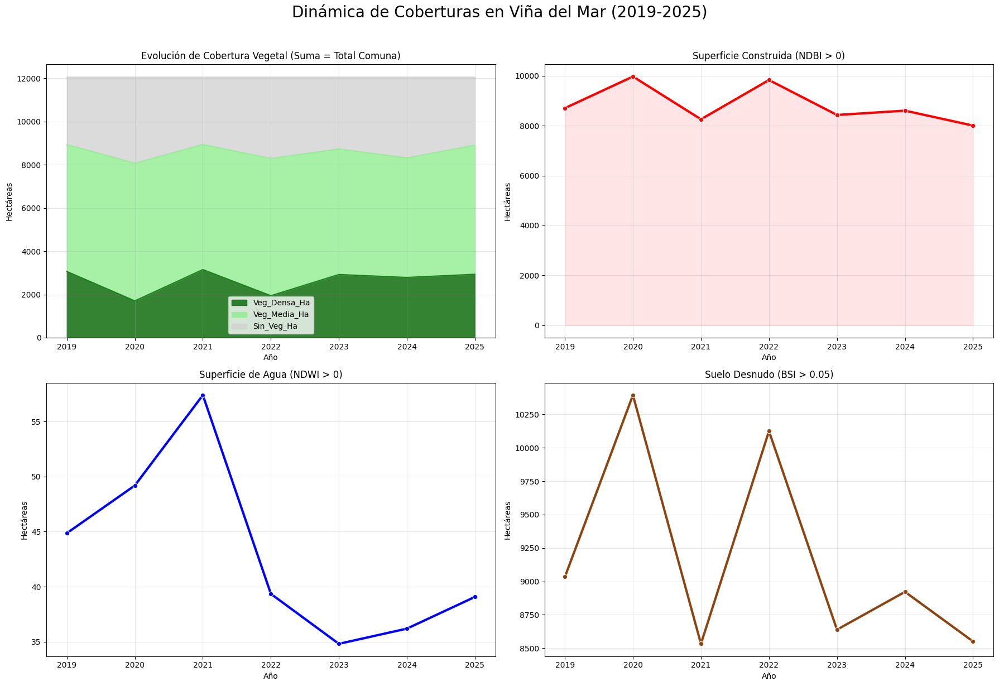

,Año,Total_Ha,Veg_Densa_Ha,Veg_Media_Ha,Sin_Veg_Ha,Urbano_Ha,Agua_Ha,Suelo_Ha
0,2019,12055.42,3065.98,5871.01,3118.43,8704.74,44.86,9034.36
1,2020,12055.64,1704.63,6369.67,3981.34,9970.94,49.19,10394.47
2,2021,12055.95,3152.59,5789.56,3113.80,8257.51,57.40,8532.82
3,2022,12055.31,1943.40,6348.78,3763.13,9831.47,39.35,10124.65
4,2023,12055.81,2924.46,5808.68,3322.67,8430.30,34.81,8638.84
5,2024,12055.43,2788.79,5532.41,3734.23,8603.39,36.19,8921.84
6,2025,12055.52,2935.07,5975.36,3145.09,8004.93,39.07,8550.82


In [6]:
# --- CÁLCULO DE SUPERFICIES CLASIFICADAS POR AÑO ---
print("➤ Calculando evolución de superficies clasificadas (Lógica Estricta)...")

# Lista para acumular resultados de superficies clasificadas
resultados_clases = []

# --- Iterar sobre cada imagen de índices ---
for img in imagenes:
    year = img.stem.split("_")[1] # Extraer año del nombre del archivo
    # Abrir archivo raster para lectura
    with rasterio.open(img) as src:
        # Recorte exacto 
        if gdf_limite_global.crs != src.crs: # Si difieren los CRS
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else: # Si son iguales
            gdf_recorte = gdf_limite_global # No se requiere reproyección
        # Aplicar máscara de recorte espacial
        out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
        # out_image tiene forma (bandas, alto, ancho) donde:
        # Banda 0=NDVI, Banda 1=NDBI, Banda 2=NDWI, Banda 3=BSI
        ndvi = out_image[0]
        ndbi = out_image[1]
        ndwi = out_image[2]
        bsi  = out_image[3]
        
        # --- MÁSCARA MAESTRA DE VALIDEZ ---
        # Un píxel es válido solo si está dentro de la comuna (NDVI != 0) 
        # Y es un número real (no infinito, no error)
        valid_mask = (ndvi != 0) & np.isfinite(ndvi)
        
        # Total Real (Base para porcentajes)
        total_pixels = np.count_nonzero(valid_mask)
        factor_ha = 0.01
        area_total_ha = total_pixels * factor_ha
        
        # --- CLASIFICACIÓN (Aplicando valid_mask a todo) ---
        
        # 1. Vegetación (Solo píxeles válidos)
        veg_densa = np.count_nonzero((ndvi > 0.5) & valid_mask)
        veg_media = np.count_nonzero((ndvi >= 0.2) & (ndvi <= 0.5) & valid_mask)
        sin_veg   = np.count_nonzero((ndvi < 0.2) & valid_mask) 

        # 2. Otros Índices
        urbano = np.count_nonzero((ndbi > 0) & valid_mask)
        agua   = np.count_nonzero((ndwi > 0) & valid_mask)
        suelo  = np.count_nonzero((bsi > 0.05) & valid_mask)
        
        # Almacenar resultados en la lista
        resultados_clases.append({
            "Año": int(year),
            "Total_Ha": area_total_ha,
            "Veg_Densa_Ha": veg_densa * factor_ha,
            "Veg_Media_Ha": veg_media * factor_ha,
            "Sin_Veg_Ha": sin_veg * factor_ha,
            "Urbano_Ha": urbano * factor_ha,
            "Agua_Ha": agua * factor_ha,
            "Suelo_Ha": suelo * factor_ha
        })
# --- Crear DataFrame con resultados de superficies clasificadas ---
df_clases = pd.DataFrame(resultados_clases)

# Guardar tabla a CSV
csv_path = output_dirs["reports"] / "02_superficies_clasificadas.csv"
df_clases.to_csv(csv_path, index=False)
print(f"✔ Tabla guardada en: {csv_path}")

# --- GRÁFICOS ---
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# 1. Vegetación
df_clases.plot(x="Año", y=["Veg_Densa_Ha", "Veg_Media_Ha", "Sin_Veg_Ha"], 
               kind="area", stacked=True, color=["darkgreen", "lightgreen", "lightgray"], 
               alpha=0.8, ax=axes[0, 0])
axes[0, 0].set_title("Evolución de Cobertura Vegetal (Suma = Total Comuna)")
axes[0, 0].set_ylabel("Hectáreas")

# 2. Urbano
sns.lineplot(data=df_clases, x="Año", y="Urbano_Ha", marker="o", color="red", linewidth=3, ax=axes[0, 1])
axes[0, 1].set_title("Superficie Construida (NDBI > 0)")
axes[0, 1].set_ylabel("Hectáreas")
axes[0, 1].fill_between(df_clases["Año"], df_clases["Urbano_Ha"], color="red", alpha=0.1)

# 3. Agua
sns.lineplot(data=df_clases, x="Año", y="Agua_Ha", marker="o", color="blue", linewidth=3, ax=axes[1, 0])
axes[1, 0].set_title("Superficie de Agua (NDWI > 0)")
axes[1, 0].set_ylabel("Hectáreas")

# 4. Suelo
sns.lineplot(data=df_clases, x="Año", y="Suelo_Ha", marker="o", color="saddlebrown", linewidth=3, ax=axes[1, 1])
axes[1, 1].set_title("Suelo Desnudo (BSI > 0.05)")
axes[1, 1].set_ylabel("Hectáreas")

# Ajustes estéticos
for ax in axes.flat: ax.grid(True, alpha=0.3)

# Título general
plt.suptitle("Dinámica de Coberturas en Viña del Mar (2019-2025)", fontsize=20, y=1.02)
plt.tight_layout()

# Guardar figura completa en figures
save_path = output_dirs["figures"] / "02_evolucion_superficies_completa.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

# Mostrar DataFrame de superficies clasificadas
display(df_clases)

##### **6) Generación de mapas multiespectrales anuales**

Se generaron mapas temáticos de los 4 índices espectrales para cada año. Cada mapa incluye una barra de color con interpretación del significado de los valores bajos y altos para facilitar la lectura visual.

Esta celda realiza la cartografía temática automatizada. Su función es transformar datos numéricos abstractos en información visual interpretable mediante:

- Recorte espacial (Masking): Se utiliza el polígono vectorial de la comuna (`limite_comuna.gpkg`) para "recortar" las imágenes satelitales, eliminando el océano y comunas vecinas.

- Normalización visual: Se aplica una escala de color fija (vmin=-0.6, vmax=0.6) para todos los años. Esto es crítico para la comparación temporal, ya que asegura que el color "verde intenso" signifique lo mismo en 2019 y en 2025, permitiendo detectar cambios reales a simple vista.

- Interpretación semántica: Se añaden barras de color con etiquetas cualitativas (ej: "Veg. Densa", "Suelo Desnudo") para facilitar la lectura por parte de usuarios.

##### Análisis espacial de índices espectrales (2019-2025)

La visualización espacial de los cuatro índices calculados (NDVI, NDBI, NDWI, BSI) permite identificar patrones territoriales que las estadísticas promedio no revelan. A continuación se analiza la distribución espacial para la serie temporal:

1. NDVI (Vegetación) - Mapa 1 (Escala verde-rojo)

Se observa una clara segmentación territorial. Las zonas verdes (alta vegetación) están concentradas en el sector sureste, en lugares como la reserva Lago Peñuelas y el jardín botánico nacional. Por otro lado, las zonas amarillas (baja vegetación), se ubican en el borde costero o al plan de la ciudad, y zonas de expansión urbana en los cerros.

Respecto a la dinámica temporal, entre 2019 y 2021 se observa una cobertura vegetal sana (verde intenso) en el interior de Viña. En 2022, se aprecia un pardeamiento generalizado (tonos más amarillentos en zonas que antes eran verdes), consistente con el pico de la sequía. Por último, en 2024 y 2025 se detecta una cicatriz visible en la zona del Jardín Botánico y El Olivar (mancha amarilla verdosa en una zona históricamente verde), evidenciando el impacto del megaincendio del 2024 en Viña.

2. NDBI (Construido) - Mapa 2 (Escala azul-rojo)

Se observa un patrón espacial, donde la zona roja (urbano/suelo) marca con precisión zonas como Reñaca bajo y el eje troncal (camino internacional). Aunque en zonas de cerros no urbanizados, el NDBI muestra valores altos (tonos rojizos) en años secos (2020, 2022), lo que confirma visualmente la falsa expansión urbana mencionada anteriormente, en donde el suelo seco brilla igual que el cemento para este índice.

3. NDWI (Agua) - Mapa 3 (escala azul)

En este mapa es predominantemente el color blanco claro (tierra seca), destacando zonas como la laguna Sausalito, la cual es visible como un punto azul oscuro constante al norte del centro y la desembocadura Marga Marga que está visible en el borde costero. Además, se ven pequeños puntos azules en la  zona del Jardín Botánico que desaparecen o se reducen drásticamente en los años de sequía (2022).

4. BSI (Suelo Desnudo) - Mapa 4 (Escala Amarillo-Marrón)

Este índice actúa como el negativo del NDVI, en donde las zonas que en el mapa de NDVI aparecen como verde claro (o amarillo) (sin vegetación), aquí aparecen en rojo (casi marrón) intenso (suelo expuesto). Esto permite diferenciar mejor las zonas de dunas (como Reñaca) y las canteras o movimientos de tierra, que aparecen con valores máximos de brillo espectral.

➤ Generando mapas multiespectrales...
   ✔ Mapa 2019 guardado.


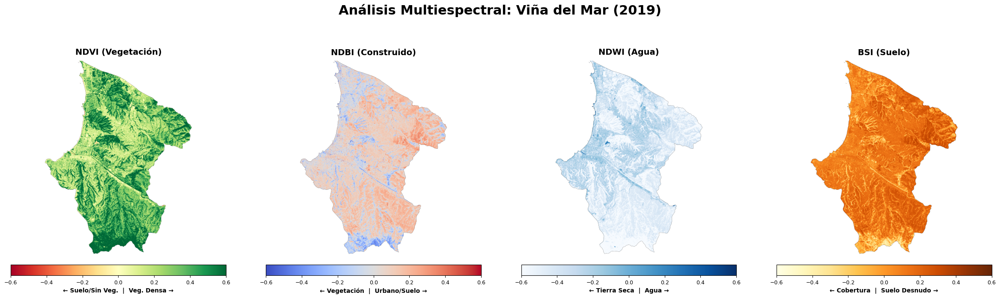

   ✔ Mapa 2020 guardado.


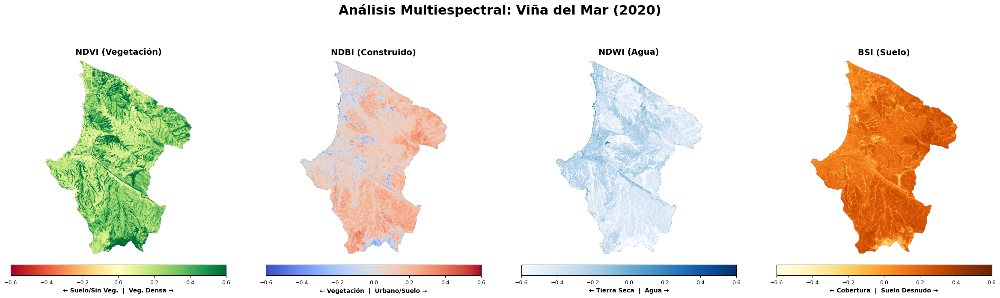

   ✔ Mapa 2021 guardado.


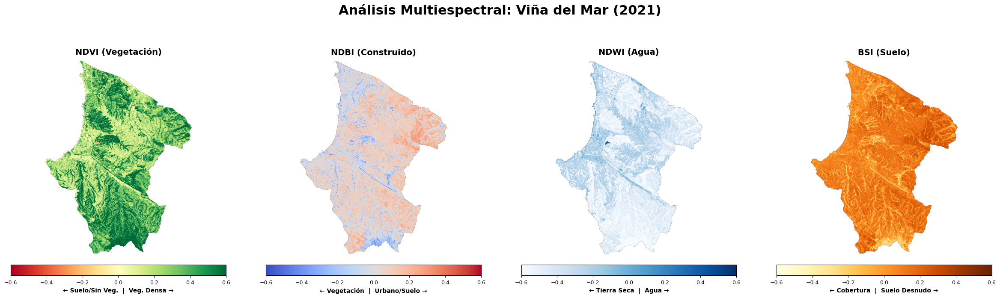

   ✔ Mapa 2022 guardado.


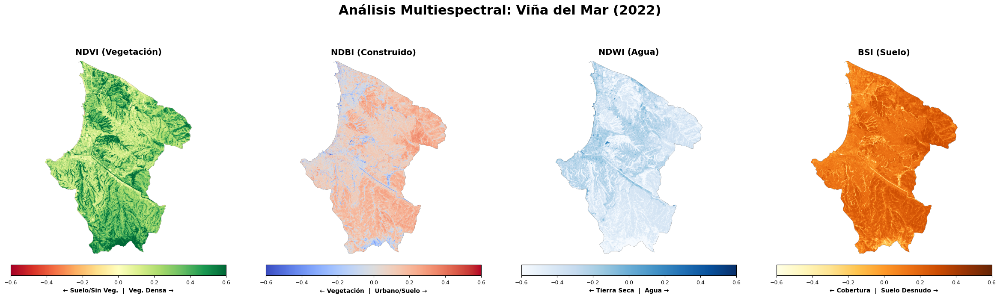

   ✔ Mapa 2023 guardado.


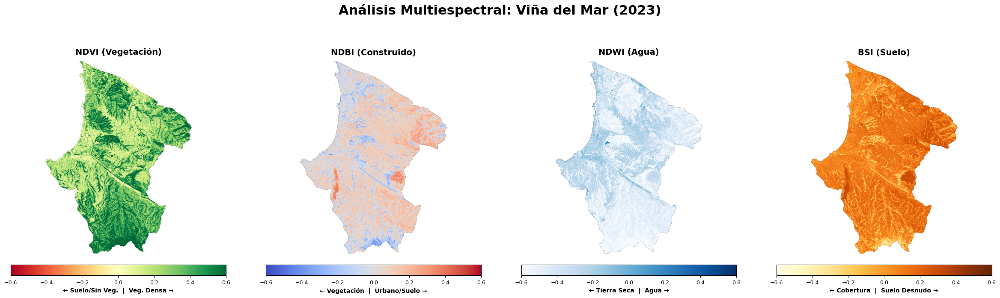

   ✔ Mapa 2024 guardado.


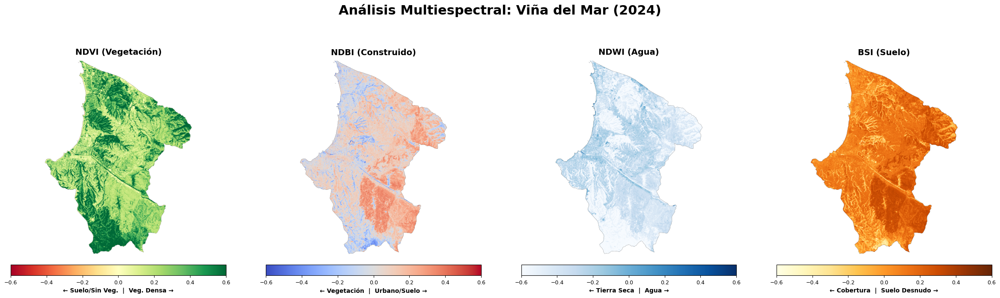

   ✔ Mapa 2025 guardado.


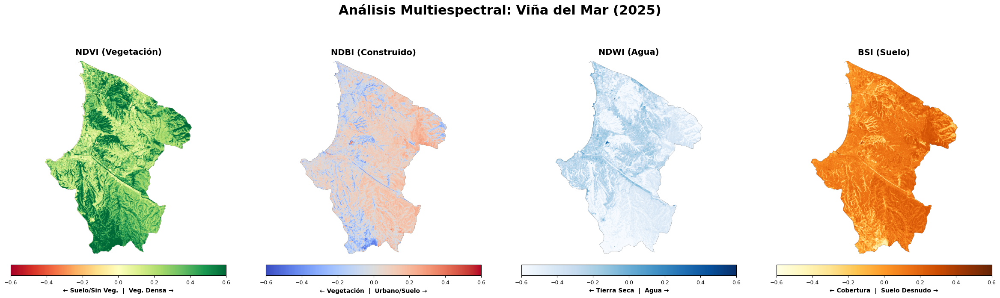

✔ Generación completada con éxito.


In [7]:
# --- Cargar límite comunal para recorte estético ---
gdf_limite_global = gpd.read_file(vector_dir / "limite_comuna.gpkg")

print("➤ Generando mapas multiespectrales...")

# --- Iterar sobre cada imagen de índices ---
for img in imagenes:
    # Extraer año del nombre del archivo
    year = img.stem.split("_")[1]
    
    # Abrir archivo raster
    with rasterio.open(img) as src:
        # 1. Gestión de proyección de coordenadas
        if gdf_limite_global.crs != src.crs: 
            gdf_recorte = gdf_limite_global.to_crs(src.crs)
        else:
            gdf_recorte = gdf_limite_global
        
        # 2. Recortar raster al límite comunal
        out_image, out_transform = mask(src, gdf_recorte.geometry, crop=True)
        
        # 3. Extraer cada banda de índice como array flotante
        ndvi = out_image[0].astype(float)  # Banda 1: Vegetación
        ndbi = out_image[1].astype(float)  # Banda 2: Construcciones
        ndwi = out_image[2].astype(float)  # Banda 3: Agua
        bsi  = out_image[3].astype(float)  # Banda 4: Suelo desnudo

        # --- Configuración de visualización para cada índice ---
        # Formato: (Datos, Título, Mapa de Color, Significado Bajo, Significado Alto)
        indices_plot = [
            (ndvi, "NDVI (Vegetación)", "RdYlGn", "Suelo/Sin Veg.", "Veg. Densa"), 
            (ndbi, "NDBI (Construido)", "coolwarm", "Vegetación", "Urbano/Suelo"), 
            (ndwi, "NDWI (Agua)",       "Blues",    "Tierra Seca",    "Agua"),       
            (bsi,  "BSI (Suelo)",       "YlOrBr",   "Cobertura",      "Suelo Desnudo") 
        ]

        # --- Crear figura con 4 subplots horizontales ---
        fig, axes = plt.subplots(1, 4, figsize=(24, 7))
        
        # Plotear cada índice en su subplot correspondiente
        for ax, (data, title, cmap, desc_min, desc_max) in zip(axes, indices_plot):
            # Limpiar píxeles de fondo (valor 0) para visualización
            data[data == 0] = np.nan 
            
            # Renderizar imagen con escala de colores
            # vmin/vmax fijan el rango de la paleta de colores
            im = ax.imshow(data, cmap=cmap, vmin=-0.6, vmax=0.6) 
            ax.set_title(title, fontsize=14, fontweight='bold', pad=10)
            ax.axis('off')  # Ocultar ejes para mejor visualización
            
            # --- Agregar barra de color con interpretación ---
            # fraction y pad controlan tamaño y separación de la barra
            cbar = fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.05, pad=0.05)
            cbar.ax.tick_params(labelsize=9) 
            
            # Etiqueta explicativa con significado de valores extremos
            cbar.set_label(f"← {desc_min}  |  {desc_max} →", fontsize=10, fontweight='bold')
            
        # --- Título principal del panel ---
        plt.suptitle(f"Análisis Multiespectral: Viña del Mar ({year})", fontsize=22, fontweight='bold')
        
        # --- Ajuste de espaciado ---
        # rect=[left, bottom, right, top] reserva espacio para el título
        plt.tight_layout(rect=[0, 0, 1, 0.92])
        
        # --- Guardar mapa como imagen PNG ---
        save_path = output_dirs["maps"] / f"02_mapa_indices_{year}.png"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"   ✔ Mapa {year} guardado.")
        
        plt.show() 
        plt.close()  # Liberar memoria
        
print("✔ Generación completada con éxito.")

##### **7. Mapas de evolución temporal por índice**

Esta celda implementa una función reutilizable plot_evolution para generar mapas comparativos que muestran la evolución de un índice espectral a lo largo del tiempo y permite visualizar cambios en vegetación, urbanización, agua o suelo comparando múltiples años en una sola figura. Forzando el mismo rango de colores (vmin/vmax) para todos los años de un mismo índice, haciendo que los colores sean comparables cuantitativamente.

##### Análisis de evolución temporal comparativa (2019-2025):

La visualización secuencial de cada índice permite identificar patrones de cambio gradual y eventos disruptivos a lo largo de los 7 años de estudio:

1. Serie temporal NDVI (Vegetación) - Mapa verde: Al observar la secuencia de 2019 a 2025, se evidencia la vegetación en respuesta a la disponibilidad hídrica. En 2019, se observa una vegetación vigorosa (verde intenso) en los cerros interiores. En 2020 y 2022 (sequía) se observa un debilitamiento progresivo del color verde hacia tonos amarillentos, especialmente en la periferia de la mancha urbana, lo que indica estrés hídrico generalizado, no deforestación. En 2024 y 2025 (cicatriz de fuego) aparece abruptamente una mancha verde amarillenta (sin vegetación) en la zona sureste (en la zona del Jardín Botánico) que no existía en los años previos, diferenciándose claramente del estrés por sequía por su borde definido.

2. Serie temporal NDBI (Construido) - Mapa rojo/azul: El núcleo urbano central (como Reñaca Bajo) se mantiene estable en rojo todos los años. Respecto a tiempos de sequía, en 2020 y 2022, los cerros no urbanizados se tiñen de rojo suave, este mapa confirma que el índice NDBI es altamente sensible a la aridez del suelo, generando falsos positivos de urbanización en años secos. Si se ignora el ruido de la sequía, se detecta una expansión hormiga (píxel a píxel) hacia el sector de Reñaca Alto y Glorias Navales, donde el color rojo se vuelve más compacto año tras año.

3. Serie temporal NDWI (Agua) - Mapa azul: En este mapa sectores como la laguna Sausalito y los tranques menores se ven grandes y azules en 2019. En 2022, estos cuerpos de agua se reducen a su mínima expresión (puntos casi imperceptibles), recuperando volumen ligeramente hacia 2025. Este mapa actúa como un registro histórico de la crisis hídrica de la región.

4. Serie temporal BSI (Suelo desnudo) - Mapa rojo/marrón: En este mapa se muestra la expansión de zonas áridas. Zonas cercanas a las dunas de Concón/Reñaca aparecen siempre con valores máximos (marrón oscuro). Luego del incendio del 2024 (2024 y 2025), la zona quemada aparece con valores máximos de suelo desnudo (tonos rojos intensos), confirmando la pérdida total de la cobertura vegetal protectora y el riesgo de erosión asociado.

➤ Generando mapas de evolución...
✔ Mapa NDVI guardado: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\maps\02_evolucion_ndvi.png


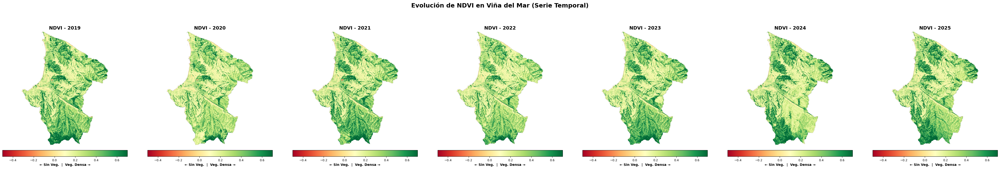

✔ Mapa NDBI guardado: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\maps\02_evolucion_ndbi.png


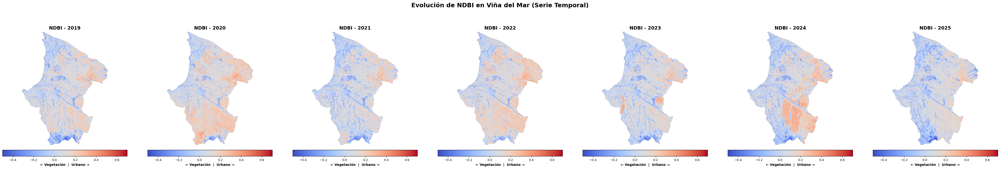

✔ Mapa NDWI guardado: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\maps\02_evolucion_ndwi.png


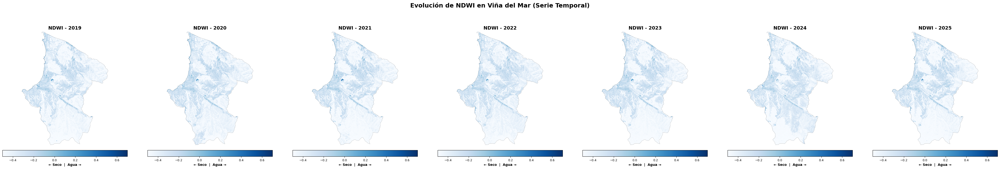

✔ Mapa BSI guardado: C:\Users\arace\Documents\GitHub\laboratorio_cambio_urbano\outputs\maps\02_evolucion_bsi.png


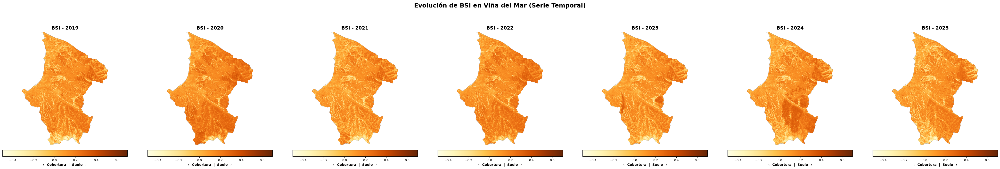

✔ Listo.


In [8]:
def plot_evolution(nombre_indice, idx_banda, colormap, etiqueta_baja, etiqueta_alta):
    """
    Genera un mapa comparativo de la evolución temporal de un índice espectral.
    
    Descripción:
        Esta función crea una figura con múltiples subplots, uno por cada año
        disponible en el análisis. Cada subplot muestra el índice espectral
        recortado al límite comunal con una barra de color interpretativa.
        Facilita la comparación visual de cambios temporales en la cobertura
        terrestre de Viña del Mar.
    
    Entradas:
        nombre_indice (str): Nombre del índice para usar en títulos y nombre 
                             de archivo (ej: "NDVI", "NDBI", "NDWI", "BSI").
        idx_banda (int): Posición de la banda del índice en el archivo raster
                         multibanda (0=NDVI, 1=NDBI, 2=NDWI, 3=BSI).
        colormap (str): Nombre del mapa de colores de matplotlib a utilizar
                        (ej: "RdYlGn", "coolwarm", "Blues", "YlOrBr").
        etiqueta_baja (str): Texto descriptivo para valores bajos del índice,
                             se muestra en el lado izquierdo de la barra de color.
        etiqueta_alta (str): Texto descriptivo para valores altos del índice,
                             se muestra en el lado derecho de la barra de color.
    
    Salidas:
        No retorna valores. Genera y guarda un archivo PNG en el directorio
        de mapas (outputs/maps/) y muestra la figura en pantalla.
    """
    # --- Cargar límite comunal ---
    gdf_limite = gpd.read_file(vector_dir / "limite_comuna.gpkg")
    
    # Determinar número de años y crear subplots
    n_years = len(imagenes)
    fig, axes = plt.subplots(1, n_years, figsize=(6*n_years, 7))
    
    # Si solo hay un año, convertir a lista para iteración uniforme
    if n_years == 1: 
        axes = [axes]

    # --- Iterar sobre cada imagen ---
    for ax, img in zip(axes, imagenes):
        # Extraer año del nombre de archivo
        year = img.stem.split("_")[1]
        
        # Abrir y procesar raster
        with rasterio.open(img) as src:
            # Reproyectar límite si es necesario
            if gdf_limite.crs != src.crs: 
                gdf_recorte = gdf_limite.to_crs(src.crs)
            else:
                gdf_recorte = gdf_limite
            
            # Aplicar máscara de recorte al límite comunal
            out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
            
            # Extraer banda específica del índice
            indice = out_image[idx_banda].astype(float)
            indice[indice == 0] = np.nan  # Eliminar fondo

        # --- Renderizar mapa en el subplot ---
        im = ax.imshow(indice, cmap=colormap, vmin=-0.5, vmax=0.7)
        ax.set_title(f"{nombre_indice} - {year}", fontsize=14, fontweight='bold')
        ax.axis('off')
        
        # Agregar barra de color con etiquetas interpretativas
        cbar = fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
        cbar.ax.tick_params(labelsize=9)
        cbar.set_label(f"← {etiqueta_baja}  |  {etiqueta_alta} →", fontsize=10, fontweight='bold')

    # --- Título principal y ajuste de layout ---
    plt.suptitle(f"Evolución de {nombre_indice} en Viña del Mar (Serie Temporal)",
                 fontsize=18, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    
    # --- Guardar figura ---
    save_path = output_dirs["maps"] / f"02_evolucion_{nombre_indice.lower()}.png"
    plt.savefig(save_path, dpi=200)
    print(f"✔ Mapa {nombre_indice} guardado: {save_path}")
    plt.show()
    plt.close()

# --- Diccionario de configuración por índice ---
# Clave: Nombre del índice
# Valor: (Banda, Colormap, Etiqueta baja, Etiqueta alta)
indices_config = {
    "NDVI": (0, "RdYlGn", "Sin Veg.", "Veg. Densa"),
    "NDBI": (1, "coolwarm", "Vegetación", "Urbano"),
    "NDWI": (2, "Blues", "Seco", "Agua"),
    "BSI":  (3, "YlOrBr", "Cobertura", "Suelo")
}

# --- Generar mapas de evolución para cada índice ---
print("➤ Generando mapas de evolución...")
for nombre, (idx, cmap, et_bajo, et_alto) in indices_config.items():
    plot_evolution(nombre, idx, cmap, et_bajo, et_alto)
print("✔ Listo.")

##### **8) Histogramas anuales por índice**

Esta celda genera histogramas con estimación de densidad de kernel (KDE) superpuesta para cada índice espectral, para visualizar la frecuencia de valores de cada píxel. Se generó una figura por cada año del análisis, permitiendo visualizar la distribución de valores y detectar cambios en la forma de la distribución. A continuación, se indican algunos detalles de la implementación:

- Aplanamiento de datos (.flatten()): Las matrices raster 2D (alto x ancho) se convierten en vectores 1D para poder ser procesados estadísticamente.

- Limpieza de Datos: Se eliminan valores NaN e Inf. Además, se eliminan explícitamente los valores 0. Esto es crucial porque el recorte (mask) rellena el exterior de la comuna con cerros. Si no se filtran, aparecería un pico gigantesco en 0 que distorsionaría totalmente la escala del gráfico.

- Muestreo aleatorio (Subsampling): Dado que una imagen Sentinel-2 tiene millones de píxeles, procesar un histograma con todos ellos es computacionalmente costoso y visualmente redundante. Por ende, el script implementa un muestreo inteligente, si hay más de 50,000 píxeles válidos, selecciona aleatoriamente 50,000. Esto mantiene la forma estadística de la distribución (Teorema del Límite Central) pero reduce el tiempo de generación de segundos a milisegundos.

##### Análisis de los histogramas anuales por índice:
1. NDVI (histograma verde): los histogramas de NDVI presentan generalmente una distribución bimodal (dos picos), lo cual es típico de zonas heterogéneas como Viña del Mar. El pico izquierdo (~0.2) representa la matriz urbana y el suelo desnudo (como Plan de Viña, dunas). Y el pico Derecho (~0.5 - 0.6) representa la "matriz natural" (bosques, parques, cerros con vegetación). Respecto a la dinámica temporal, en 2019 (años base) se observa un pico un poco aplanado, en cambio, en 2020 y 2022 (en tiempos de sequía), el pico derecho (vegetación) se aplana hacia la izquierda y la distribución pierde su forma bimodal y se vuelve más informe, esto indica que la vegetación perdió vigor, volviéndose espectralmente similar al suelo desnudo. En 2024 y 2025 la distribución vuelve a mostrarse más saludable (pico derecho más alto), aunque con una "cola" hacia la izquierda que podría corresponder a las zonas quemadas.

2. NDBI (histograma rojo): los histogramas de NDBI muestran en general una distribución unimodal centrada cerca de 0, pero con una larga cola hacia la derecha (valores positivos). El grueso de los datos (el pico) está cerca de 0 o valores negativos (vegetación). La cola positiva representa la intensidad de la urbanización. Aunque se observa una anomalía, en los años años secos (2020, 2022), el histograma entero se desplaza ligeramente a la derecha. Esto confirma que la sequía "empuja" los valores espectrales hacia el comportamiento urbano (falsos positivos).

3. NDWI (histograma azul): los histogramas NDWI en general muestran una distribución fuertemente sesgada hacia valores negativos (pico en -0.4 a -0.5). Como el análisis se recorta al límite terrestre, la inmensa mayoría de los píxeles son "Tierra Seca" (valores negativos). Los cuerpos de agua reales (como la Laguna Sausalito) son tan pequeños en proporción al área total que no alcanzan a formar un segundo pico visible, apareciendo solo como pequeños valores en el extremo derecho (>0).

4. BSI (Naranja): los histogramas BSI en general muestran un comportamiento muy similar al NDBI, con un pico centrado en valores bajos y una dispersión hacia valores positivos en años de estrés hídrico. Su coincidencia morfológica con el NDBI refuerza la teoría de que en Viña del Mar es difícil separar espectralmente el suelo desnudo de la zona urbana densa usando solo bandas ópticas.

➤ Generando histogramas anuales (Visualización Activada)...
   ✔ Histograma 2019 guardado.


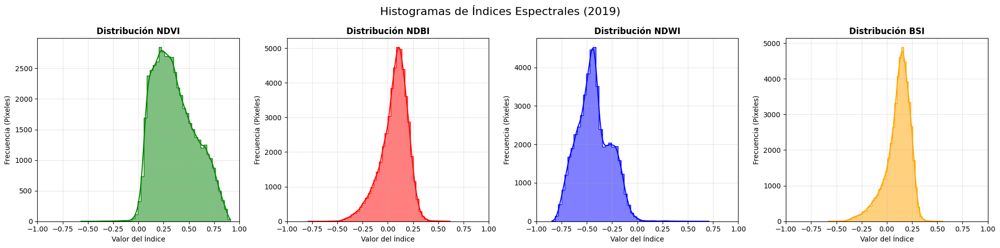

   ✔ Histograma 2020 guardado.


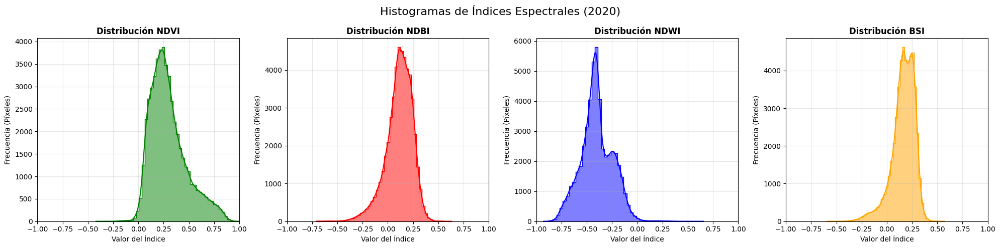

   ✔ Histograma 2021 guardado.


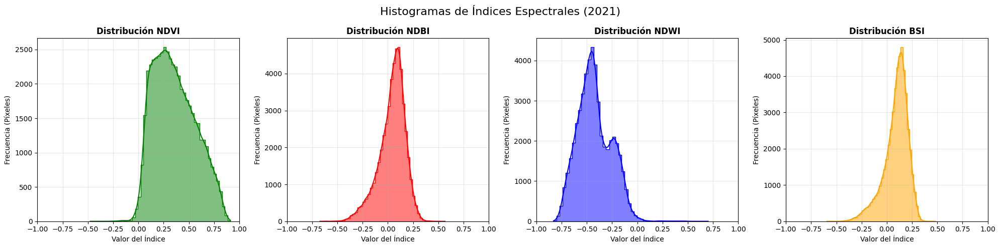

   ✔ Histograma 2022 guardado.


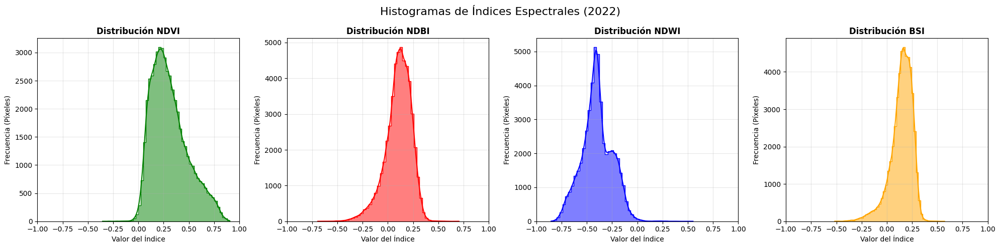

   ✔ Histograma 2023 guardado.


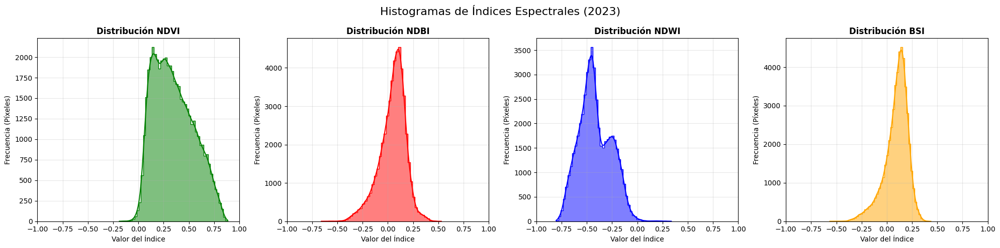

   ✔ Histograma 2024 guardado.


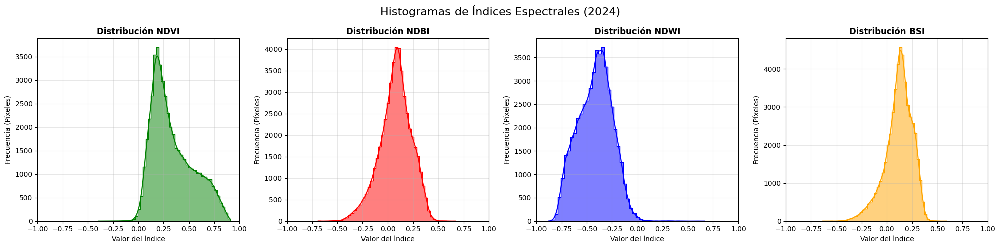

   ✔ Histograma 2025 guardado.


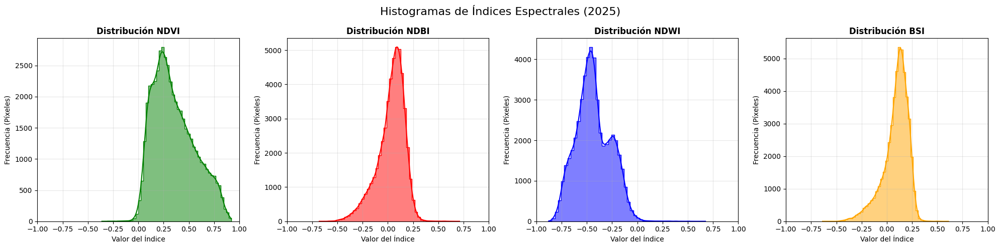

✔ Generación de histogramas completada.


In [9]:
print("➤ Generando histogramas anuales (Visualización Activada)...")

labels = ["NDVI", "NDBI", "NDWI", "BSI"]
colors = ["green", "red", "blue", "orange"]

for img in imagenes: # Iterar sobre cada imagen de índices
    year = img.stem.split("_")[1] # Extraer año del nombre del archivo
    
    with rasterio.open(img) as src: # Abrir archivo raster
        # Gestión de proyección y recorte
        if gdf_limite_global.crs != src.crs: # Si difieren los CRS
            gdf_recorte = gdf_limite_global.to_crs(src.crs) # Reproyectar
        else: # Si son iguales
            gdf_recorte = gdf_limite_global # No se requiere reproyección
        # Aplicar máscara de recorte espacial
        out_image, _ = mask(src, gdf_recorte.geometry, crop=True)
        
        # Extraer datos
        datas = [
            out_image[0].flatten(), # NDVI
            out_image[1].flatten(), # NDBI
            out_image[2].flatten(), # NDWI
            out_image[3].flatten()  # BSI
        ]
        # --- Crear figura con 4 subplots ---
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        # Iterar sobre cada índice y su subplot correspondiente
        for ax, data, label, color in zip(axes, datas, labels, colors):
            # Limpieza
            data = data.astype(float)
            valid_values = data[np.isfinite(data)] # Filtrar valores finitos
            valid_values = valid_values[valid_values != 0] # Eliminar ceros 
            
            # Sampleo
            if len(valid_values) > 50000: # Limitar a 50,000 puntos para eficiencia
                valid_values = np.random.choice(valid_values, 50000, replace=False)
            # Plotear histograma con KDE
            sns.histplot(valid_values, bins=50, kde=True, color=color, ax=ax, element="step")
            
            # --- ETIQUETAS DE EJES (NUEVO) ---
            ax.set_title(f"Distribución {label}", fontsize=12, fontweight='bold')
            ax.set_xlabel("Valor del Índice")
            ax.set_ylabel("Frecuencia (Píxeles)")
            
            ax.set_xlim(-1, 1) 
            ax.grid(True, alpha=0.3)
        # Título general
        plt.suptitle(f"Histogramas de Índices Espectrales ({year})", fontsize=16)
        plt.tight_layout()
        # Guardar figura
        save_path = output_dirs["figures"] / f"02_histogramas_indices_{year}.png"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"   ✔ Histograma {year} guardado.")
        # Mostrar figura
        plt.show() 
        plt.close()

print("✔ Generación de histogramas completada.")

##### **9) Distribuciones KDE por período (2019-2025)**


Esta celda implementa una visualización avanzada de Densidad de Kernel (KDE) segmentada temporalmente para facilitar la comparación interanual, entre dos períodos: 2019-2022 y 2023-2025. En otras palabras, permite identificar desplazamientos en la distribución que indiquen cambios en la cobertura terrestre de Viña del Mar, aplicando la siguiente metodología:

- Segmentación temporal: Se divide el análisis en dos ventanas de tiempo (2019-2022 y 2023-2025) para evitar la superposición de 7 líneas en un solo gráfico, lo que dificulta la lectura visual.

- Visualización KDE (kdeplot): Se utiliza la estimación de densidad de kernel en lugar de histogramas de barras.

##### Análisis de distribuciones KDE por período
1. Comparativa NDVI (Vegetación): En el período 2019-2022, se observa cómo las curvas de 2020 y 2022 se desplazan hacia la izquierda en comparación con 2019. Además, el pico de "alta vegetación" (>0.5) se reduce drásticamente, evidenciando el estrés hídrico generalizado de la sequía. Por otro lado, en el período 2023-2025, la curva de 2025 muestra una recuperación del pico de vegetación densa en comparación con los años secos, desplazándose hacia la derecha. Sin embargo, a pesar de la recuperación general, la curva de 2025 presenta un ligero ensanchamiento en la base de valores bajos (~0.2), lo que podría ser la firma espectral de la zona quemada, que contrasta con el reverdecimiento del resto de la comuna.

2. Comparativa NDBI (Urbano/Construido): En estos gráficos las curvas de todos los años mantienen una forma similar, lo que confirma que la estructura urbana principal de Viña del Mar no ha cambiado radicalmente. Aunque en el periodo 2019-2022, las curvas de 2020 y 2022 son más "anchas" hacia la derecha (valores positivos), esto no es expansión urbana real, sino suelo desnudo seco que brilla más en la banda SWIR, inflando artificialmente el índice. Y respecto al período 2023-2025, las curvas de los últimos años son más compactas y similares entre sí, sugiriendo que, al haber más humedad, el suelo desnudo se diferencia mejor de la zona urbana, reduciendo el error del índice.

3. Comparativa NDWI (Agua): En estos gráficos las curvas son extremadamente agudas y negativas, confirmando la escasez de cuerpos de agua superficiales relevantes. Además, no se observan cambios dramáticos en la forma de la distribución, salvo pequeñas variaciones en la cola derecha las cuales probablemente se asocien al nivel de la Laguna Sausalito.

4. BSI (Suelo): Muestra un comportamiento especular al NDVI. En 2020 y 2022, la distribución se mueve a la derecha (más suelo expuesto). En 2025, se retrae ligeramente a la izquierda (menos suelo expuesto) gracias a la recuperación vegetal, excepto en las zonas de incendio puntual.

➤ Muestreando datos de los 4 índices...
✔ Gráfico guardado: 02_distribucion_NDVI_NDBI_split.png


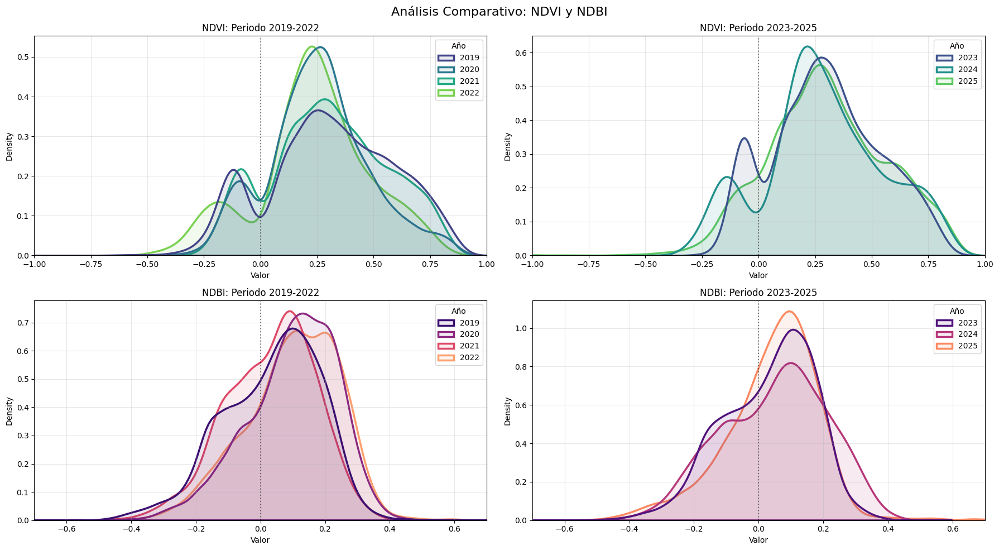

✔ Gráfico guardado: 02_distribucion_NDWI_BSI_split.png


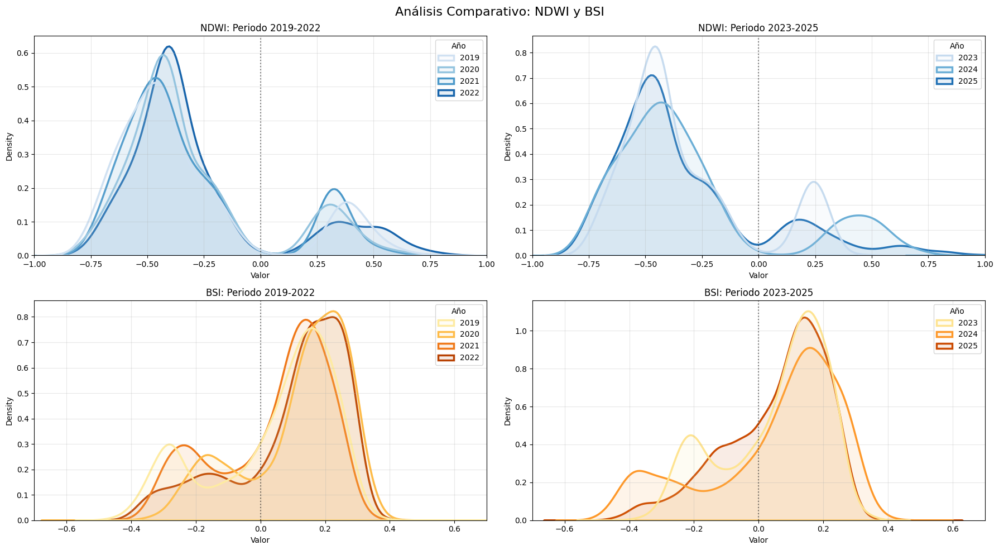

In [10]:
import seaborn as sns # Visualizaciones estadísticas avanzadas

# Configuración
SAMPLE_SIZE = 10000 # Número de muestras aleatorias por año/índice
data_hist = [] # Lista para acumular datos de histogramas
periodos = { # Definición de períodos temporales (para que los gráficos no se vean saturados)
    "2019-2022": ["2019", "2020", "2021", "2022"],
    "2023-2025": ["2023", "2024", "2025"]
}

# --- DEFINICIÓN DE LÍMITES VISUALES ---
# Ampliamos a los límites teóricos
LIMITES_VISUALES = {
    "NDVI": (-1.0, 1.0), 
    "NDBI": (-0.7, 0.7), 
    "NDWI": (-1.0, 1.0), 
    "BSI":  (-0.7, 0.7)  
}

print("➤ Muestreando datos de los 4 índices...")
# --- Iterar sobre cada imagen de índices ---
for img in imagenes:
    year = img.stem.split("_")[1] # Extraer año del nombre del archivo
    with rasterio.open(img) as src: # Abrir archivo raster
        # Recorte espacial
        # 1:NDVI, 2:NDBI, 3:NDWI, 4:BSI
        indices_map = {1: "NDVI", 2: "NDBI", 3: "NDWI", 4: "BSI"}
        # Iterar sobre cada índice
        for band_idx, name in indices_map.items(): 
            data = src.read(band_idx).flatten() # Extraer banda y aplanar
            data = data[np.isfinite(data)] # No infinitos/nans
            data = data[data != 0]         # No fondo
            
            # Muestreo aleatorio
            if len(data) > SAMPLE_SIZE: # Si hay más datos que el tamaño de muestra
                # Muestreo sin reemplazo
                sample = np.random.choice(data, SAMPLE_SIZE, replace=False) 
            else: # Si hay menos datos que el tamaño de muestra
                sample = data # Usar todos los datos disponibles
            
            for val in sample: # Agregar cada valor muestreado a la lista
                data_hist.append({"Año": year, "Valor": val, "Índice": name})

df_hist = pd.DataFrame(data_hist) # Crear DataFrame con datos muestreados

def plot_split_distributions(indices_target, filename_suffix, colors):
    """
    Genera gráficos KDE comparando dos índices entre dos períodos temporales.
    
    Descripción:
        Crea una figura 2x2 donde cada fila corresponde a un índice y cada
        columna a un período temporal. Las curvas KDE superponen años para
        comparar visualmente cambios en la distribución de valores.
    
    Entradas:
        indices_target (list): Lista con 2 nombres de índices a graficar.
        filename_suffix (str): Sufijo para el nombre del archivo de salida.
        colors (list): Lista de 2 paletas de colores (una por índice).
    
    Salidas:
        No retorna valores. Guarda figura PNG y muestra en pantalla.
    """
    fig, axes = plt.subplots(2, 2, figsize=(18, 10)) # 2 filas x 2 columnas
    # Iterar sobre cada índice objetivo
    for i, indice in enumerate(indices_target): 
        # Filtrar DataFrame para el índice actual
        df_indice = df_hist[df_hist["Índice"] == indice]
        # Obtener límites visuales específicos
        xmin, xmax = LIMITES_VISUALES.get(indice, (-1, 1))

        # Periodo 1
        years_p1 = periodos["2019-2022"]
        df_p1 = df_indice[df_indice["Año"].isin(years_p1)]
        # Plotear KDE para el primer período
        sns.kdeplot(data=df_p1, x="Valor", hue="Año", palette=colors[i], 
                    fill=True, alpha=0.1, linewidth=2.5, ax=axes[i, 0])
        axes[i, 0].set_title(f"{indice}: Periodo 2019-2022")
        axes[i, 0].grid(True, alpha=0.3)
        axes[i, 0].set_xlim(xmin, xmax) 
        axes[i, 0].axvline(0, color='black', linestyle=':', alpha=0.5)
        
        # Periodo 2
        years_p2 = periodos["2023-2025"]
        # Filtrar DataFrame para el segundo período
        df_p2 = df_indice[df_indice["Año"].isin(years_p2)]
        
        sns.kdeplot(data=df_p2, x="Valor", hue="Año", palette=colors[i], 
                    fill=True, alpha=0.1, linewidth=2.5, ax=axes[i, 1])
        axes[i, 1].set_title(f"{indice}: Periodo 2023-2025")
        axes[i, 1].grid(True, alpha=0.3)
        axes[i, 1].set_xlim(xmin, xmax)
        axes[i, 1].axvline(0, color='black', linestyle=':', alpha=0.5)
    # Título general
    plt.suptitle(f"Análisis Comparativo: {indices_target[0]} y {indices_target[1]}", fontsize=16)
    plt.tight_layout()
    # Guardar figura
    save_path = output_dirs["figures"] / f"02_distribucion_{filename_suffix}.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"✔ Gráfico guardado: {save_path.name}")
    plt.show()

# --- GENERAR GRÁFICOS ---
plot_split_distributions(["NDVI", "NDBI"], "NDVI_NDBI_split", ["viridis", "magma"])
plot_split_distributions(["NDWI", "BSI"], "NDWI_BSI_split", ["Blues", "YlOrBr"])